# PINNs

# Libraries

In [ ]:
from pyDOE import lhs
import numpy as np
import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.autograd as autograd         # computation graph
from torch import Tensor                  # tensor node in the computation graph
import torch.nn as nn                     # neural networks
import torch.optim as optim               # optimizers e.g. gradient descent, ADAM, etc.

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.ticker
from sklearn.model_selection import train_test_split
import time
import scipy.io
import plotly.graph_objs as go
import torch.nn.init as init
device = torch.device("cpu")

In [ ]:
print(scipy.__version__)

1.9.3


# ODE

## Ex1:
$$
y' = sin(x)
$$
$$
    y(0) = 3
$$
$$
    y = -cos(x) + 4
$$

In [ ]:
# The collocation points used by Lagaris
x = torch.Tensor(np.linspace(0, 2, 100)[:, None])

net = nn.Sequential(
    nn.Linear(1, 50),
    nn.Sigmoid(),
    nn.Linear(50, 1, bias = False),
).to(device = device)


# Initial condition
A = 3.

# Phương trình tổng quát
def Psi(x):
    return A + x * net(x)


# f(x)
def f(x, outputs):
    return torch.sin(x)

# Loss of Differential Equations
def loss(x):
    x.requires_grad = True
    outputs = Psi(x)
    op = torch.ones_like(outputs)
    op.requires_grad = True
    Psi_t_x = torch.autograd.grad(outputs, x, grad_outputs=op,
                                  create_graph=True)[0]
    return torch.mean((Psi_t_x - f(x, outputs)) ** 2)

In [ ]:
# Optimize (same algorithm as in Lagaris)
optimizer = torch.optim.LBFGS(net.parameters())

Step 0:  tensor(1.2063e-05, grad_fn=<MeanBackward0>)
Step 1:  tensor(4.9260e-06, grad_fn=<MeanBackward0>)
Step 2:  tensor(4.1598e-06, grad_fn=<MeanBackward0>)
Step 3:  tensor(3.9941e-06, grad_fn=<MeanBackward0>)
Step 4:  tensor(3.7573e-06, grad_fn=<MeanBackward0>)
Step 5:  tensor(3.5949e-06, grad_fn=<MeanBackward0>)
Step 6:  tensor(3.5231e-06, grad_fn=<MeanBackward0>)
Step 7:  tensor(3.4910e-06, grad_fn=<MeanBackward0>)
Step 8:  tensor(3.4910e-06, grad_fn=<MeanBackward0>)
Step 9:  tensor(3.4910e-06, grad_fn=<MeanBackward0>)


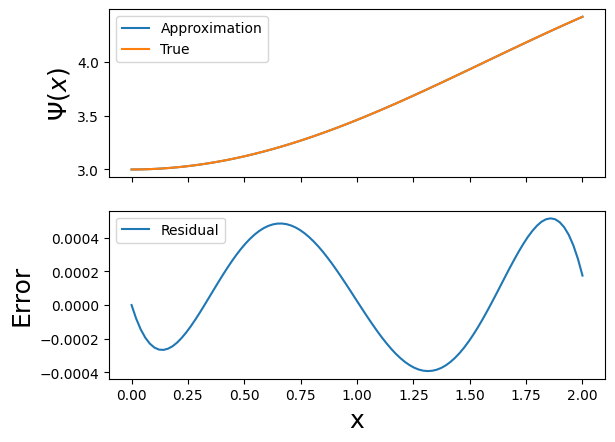

In [ ]:
# Run the optimizer
def closure():

    optimizer.zero_grad()
    l = loss(x)
    l.backward()
    return l

for i in range(10):
    op = optimizer.step(closure)
    if i % 1 == 0:
        print(f'Step {i}: ', optimizer.step(closure))

x = torch.linspace(0, 2, 100, requires_grad=True).unsqueeze(1)
y_approx = (A + x * net(x)).squeeze(0).detach().numpy().transpose()[0]
y_exact = (-torch.cos(x)+4).squeeze(0).detach().numpy().transpose()[0]
x = x.squeeze(0).detach().numpy().transpose()[0]


fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
# Plot the analytical solution with the approximation
ax1.plot(x, y_approx, label='Approximation')
ax1.plot(x, y_exact, label='True')
ax1.legend()

# Plot the residual
ax2.plot(x, y_exact-y_approx, label='Residual')
ax2.legend()

ax2.set_xlabel('x', fontsize=18)
ax1.set_ylabel("$\Psi(x)$", fontsize=18)
ax2.set_ylabel("Error", fontsize=18)

fig.savefig('ODE_plot.png')

## Ex2:
$$
y' = \exp(\frac{-x}{5})cos(x) - \frac{y}{5}
$$
$$
    y(0) = 0
$$
$$
  y = \exp\frac{-x}{5}sin(x)
$$

In [ ]:
# N is a Neural Network - This is exactly the network used by Lagaris et al. 1997
x = torch.Tensor(np.linspace(0, 2, 100)[:, None])

net = nn.Sequential(
    nn.Linear(1, 2),
    nn.Sigmoid(),
    nn.Linear(2,1, bias=False)
)

# Initial condition
A = 0

def Psi(x):
    return A + x * net(x)

# f(x)
def f(x, Psi):
    return torch.exp(-x / 5.0) * torch.cos(x) - Psi/5.0

# Loss of Differential Equations
def loss(x):
    x.requires_grad = True
    outputs = Psi(x)
    op = torch.ones_like(outputs)
    op.requires_grad = True
    Psi_t_x = torch.autograd.grad(outputs, x, grad_outputs=op,
                                  create_graph=True)[0]
    return torch.mean((Psi_t_x - f(x, outputs)) ** 2)

Step 0:  tensor(2.5409e-05, grad_fn=<MeanBackward0>)
Step 1:  tensor(4.0906e-06, grad_fn=<MeanBackward0>)
Step 2:  tensor(4.0906e-06, grad_fn=<MeanBackward0>)
Step 3:  tensor(4.0906e-06, grad_fn=<MeanBackward0>)
Step 4:  tensor(4.0906e-06, grad_fn=<MeanBackward0>)
Step 5:  tensor(4.0906e-06, grad_fn=<MeanBackward0>)
Step 6:  tensor(4.0906e-06, grad_fn=<MeanBackward0>)
Step 7:  tensor(4.0906e-06, grad_fn=<MeanBackward0>)
Step 8:  tensor(4.0906e-06, grad_fn=<MeanBackward0>)
Step 9:  tensor(4.0906e-06, grad_fn=<MeanBackward0>)


Text(0, 0.5, 'Error')

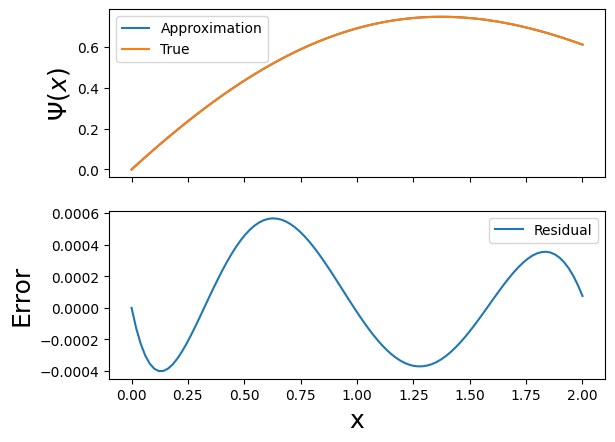

In [ ]:
# Optimize (same algorithm as in Lagaris)
optimizer = torch.optim.LBFGS(net.parameters())

# Run the optimizer
def closure():
    optimizer.zero_grad()
    l = loss(x)
    l.backward()
    return l

for i in range(10):
    optimizer.step(closure)
    print(f'Step {i}: ', optimizer.step(closure))

x = torch.linspace(0, 2, 100, requires_grad=True).unsqueeze(1)
y_approx = (A + x * net(x)).squeeze(0).detach().numpy().transpose()[0]
y_exact = (torch.exp(-x / 5.0) * torch.sin(x)).squeeze(0).detach().numpy().transpose()[0]
x = x.squeeze(0).detach().numpy().transpose()[0]


fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
# Plot the analytical solution with the approximation
ax1.plot(x, y_approx, label='Approximation')
ax1.plot(x, y_exact, label='True')
ax1.legend()

# Plot the residual
ax2.plot(x, y_exact-y_approx, label='Residual')
ax2.legend()

ax2.set_xlabel('x', fontsize=18)
ax1.set_ylabel("$\Psi(x)$", fontsize=18)
ax2.set_ylabel("Error", fontsize=18)

## Ex3:
$$
    \frac{d\Psi}{dx} + (x + \frac{1+3x^2}{1+x+x^3})\Psi = x^3 + 2x+x^2\frac{1+3x^2}{1+x+x^3}
$$

$$
    \Psi(0) = 1, \quad x \in [0,1]
$$

$$
    \Psi(x) = e^{-x^2/2}/(1+x+x^3)+x^2
$$

In [ ]:
# N is a Neural Network - This is exactly the network used by Lagaris et al. 1997
net = nn.Sequential(
    nn.Linear(1, 32),
    nn.Sigmoid(),
    nn.Linear(32,1, bias=False)
)

In [ ]:
# Initial condition
A = 1.

Step 0:  tensor(0.0015, grad_fn=<MeanBackward0>)
Step 1:  tensor(0.0007, grad_fn=<MeanBackward0>)
Step 2:  tensor(0.0002, grad_fn=<MeanBackward0>)
Step 3:  tensor(0.0001, grad_fn=<MeanBackward0>)
Step 4:  tensor(0.0001, grad_fn=<MeanBackward0>)
Step 5:  tensor(0.0001, grad_fn=<MeanBackward0>)
Step 6:  tensor(0.0001, grad_fn=<MeanBackward0>)
Step 7:  tensor(0.0001, grad_fn=<MeanBackward0>)
Step 8:  tensor(0.0001, grad_fn=<MeanBackward0>)
Step 9:  tensor(0.0001, grad_fn=<MeanBackward0>)


Text(0, 0.5, 'Error')

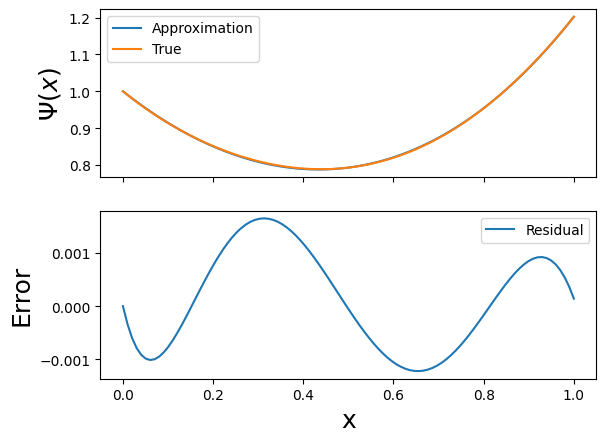

In [ ]:
def Psi(x):
    return A + x * net(x)

# f(x)
def f(x, outputs):
    return -(x+(1+3*x**2)/(1+x+x**3))*outputs + x**3+2*x+x**2*(1+3*x**2)/(1+x+x**3)

# Loss of Differential Equations
def loss(x):
    x.requires_grad = True
    outputs = Psi(x)
    op = torch.ones_like(outputs)
    op.requires_grad = True
    Psi_t_x = torch.autograd.grad(outputs, x, grad_outputs=op,
                                  create_graph=True)[0]
    return torch.mean((Psi_t_x - f(x, outputs)) ** 2)

# Optimize (same algorithm as in Lagaris)
optimizer = torch.optim.LBFGS(net.parameters())

# The collocation points used by Lagaris
x = torch.Tensor(np.linspace(0, 1, 100)[:, None])

# Run the optimizer
def closure():
    optimizer.zero_grad()
    l = loss(x)
    l.backward()
    return l

for i in range(10):
    optimizer.step(closure)
    print(f'Step {i}: ', optimizer.step(closure))

x = torch.linspace(0, 1, 100, requires_grad=True).unsqueeze(1)
y_approx = (A + x * net(x)).squeeze(0).detach().numpy().transpose()[0]
y_exact = (torch.exp(-x**2 / 2) / (1+x+x**3) + x**2 ).squeeze(0).detach().numpy().transpose()[0]
x = x.squeeze(0).detach().numpy().transpose()[0]


fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
# Plot the analytical solution with the approximation
ax1.plot(x, y_approx, label='Approximation')
ax1.plot(x, y_exact, label='True')
ax1.legend()

# Plot the residual
ax2.plot(x, y_exact-y_approx, label='Residual')
ax2.legend()

ax2.set_xlabel('x', fontsize=18)
ax1.set_ylabel("$\Psi(x)$", fontsize=18)
ax2.set_ylabel("Error", fontsize=18)

## Ex4:

$\Psi(0) = A$ và $\frac{d}{dx}\Psi(0) = A'$ \
Trial solution:
$$
    \Psi_t(x) = A+A'x+x^2N(x, \vec p),
$$

$x \in [0,2]$:

$$
    \frac{d^2\Psi}{dx^2} + \frac{1}{5}\frac{d\Psi}{dx} + \Psi = \frac{-1}{5}e^{-x/5}cosx
$$
$$
    \Psi(0) = 0\\
    \Psi_x'(0) = 1
$$
Analytical solution:
$$
    \Psi(x) = e^{-x/5}sin(x)
$$

$$
    \Psi(0) = 0 \\
    \Psi(1) = sin(1)e^{-1/5}
$$

Trial solution:

$$
    xsin(1)e^{-1/5}+x(1-x)N(x,\vec p)
$$

In [ ]:
# N is a Neural Network - This is exactly the network used by Lagaris et al. 1997
net = nn.Sequential(
    nn.Linear(1, 32),
    nn.Sigmoid(),
    nn.Linear(32,1, bias=False)
)
x = torch.Tensor(np.linspace(0, 2, 200)).reshape(-1,1)

In [ ]:
def Psi(x):
    return x + x**2 * net(x)
    #return x * np.sin(1) * np.exp(-1/5) + x*(1-x) * net(x)

def f(x, outputs):
    Psi_x = torch.autograd.grad(outputs, x, grad_outputs=torch.ones_like(outputs), create_graph=True)[0]
    Psi_xx = torch.autograd.grad(Psi_x, x, grad_outputs=torch.ones_like(outputs), create_graph=True)[0]
    return (-1/5 * torch.exp(-x/5)*torch.cos(x) - outputs - Psi_xx)*5

# Loss of Differential Equations
def loss(x):
    x.requires_grad = True
    outputs = Psi(x)
    op = torch.ones_like(outputs)
    op.requires_grad = True
    Psi_t_x = torch.autograd.grad(outputs, x, grad_outputs=op,
                                  create_graph=True)[0]
    return torch.mean((Psi_t_x - f(x, outputs)) ** 2)

Step 0:  tensor(0.0010, grad_fn=<MeanBackward0>)
Step 1:  tensor(0.0023, grad_fn=<MeanBackward0>)
Step 2:  tensor(2.2571e-05, grad_fn=<MeanBackward0>)
Step 3:  tensor(7.0062e-06, grad_fn=<MeanBackward0>)
Step 4:  tensor(4.8096e-06, grad_fn=<MeanBackward0>)
Step 5:  tensor(4.6071e-06, grad_fn=<MeanBackward0>)
Step 6:  tensor(4.4489e-06, grad_fn=<MeanBackward0>)
Step 7:  tensor(4.3335e-06, grad_fn=<MeanBackward0>)
Step 8:  tensor(4.2482e-06, grad_fn=<MeanBackward0>)
Step 9:  tensor(4.2063e-06, grad_fn=<MeanBackward0>)


Text(0, 0.5, 'Error')

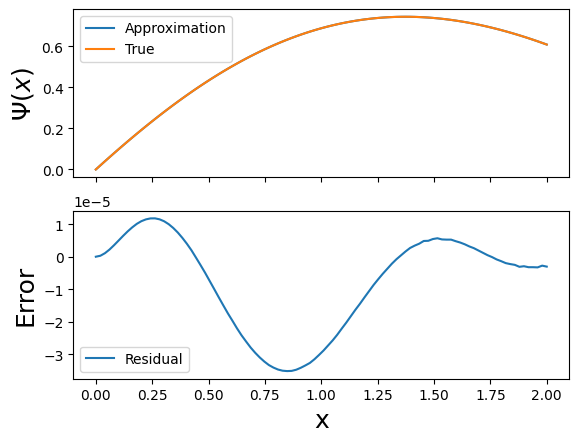

In [ ]:
optimizer = torch.optim.LBFGS(net.parameters())

# The collocation points used by Lagaris
x = torch.Tensor(np.linspace(0, 2, 100)[:, None])

# Run the optimizer
def closure():
    optimizer.zero_grad()
    l = loss(x)
    l.backward()
    return l

for i in range(10):
    optimizer.step(closure)
    print(f'Step {i}: ', optimizer.step(closure))

x = torch.linspace(0, 2, 100, requires_grad=True).unsqueeze(1)
y_approx = (x + x** 2 * net(x)).squeeze(0).detach().numpy().transpose()[0]
y_exact = (torch.exp(-x/5) * torch.sin(x)).squeeze(0).detach().numpy().transpose()[0]
x = x.squeeze(0).detach().numpy().transpose()[0]


fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
# Plot the analytical solution with the approximation
ax1.plot(x, y_approx, label='Approximation')
ax1.plot(x, y_exact, label='True')
ax1.legend()

# Plot the residual
ax2.plot(x, y_exact-y_approx, label='Residual')
ax2.legend()

ax2.set_xlabel('x', fontsize=18)
ax1.set_ylabel("$\Psi(x)$", fontsize=18)
ax2.set_ylabel("Error", fontsize=18)

## Ex5: System ODE 

$x \in [0,3]$:

$$
\begin{cases}
    \frac{d\Psi_1}{dx} = cos(x) + \Psi^2_1 + \Psi_2 - (1+x^2+sin^2(x)) \\
    \frac{d\Psi_2}{dx} = 2x-(1+x^2)sin(x)+\Psi_1\Psi_2
\end{cases}
$$

IC:

$$
    \Psi_1(0) = 0 \\
    \Psi_2(0) = 1
$$

Analytical solution:

$$
    \Psi_1(x) = sin(x) \\
    \Psi_2(x) = 1+x^2
$$

Trial solution:
$$
    \Psi_{t_1}(x) = xN_1(x, \vec p_1) \\
    \Psi_{t_2}(x) = 1+xN_2(x, \vec p_2)
$$

In [ ]:
x = torch.Tensor(np.linspace(0, 3, 200)).reshape(-1,1)
x.shape

torch.Size([200, 1])

In [ ]:
net1 = nn.Sequential(
    nn.Linear(1, 32),
    nn.Sigmoid(),
    nn.Linear(32,1, bias=False)
)

net2 = nn.Sequential(
    nn.Linear(1, 32),
    nn.Sigmoid(),
    nn.Linear(32,1, bias=False)
)

In [ ]:
def Psi_1(x):
    return x*net1(x)

def Psi_2(x):
    return 1+x*net2(x)


def f_1(x, Psi_1, Psi_2):
    Psi_1_x = torch.autograd.grad(Psi_1, x, grad_outputs=torch.ones_like(Psi_1), create_graph=True)[0]
    return torch.cos(x) + Psi_1**2 + Psi_2 - (1 + x**2 + torch.sin(x)**2)

def f_2(x, Psi_1, Psi_2):
    Psi_2_x = torch.autograd.grad(Psi_2, x, grad_outputs=torch.ones_like(Psi_2), create_graph=True)[0]
    return 2*x - (1 + x**2) * torch.sin(x) + Psi_1 * Psi_2

# Loss of Differential Equations
def loss(x):
    x.requires_grad = True

    outputs_1 = Psi_1(x)
    op1 = torch.ones_like(outputs_1)
    op1.requires_grad = True
    Psi_1_x = torch.autograd.grad(outputs_1, x, grad_outputs=op1, create_graph=True)[0]

    outputs_2 = Psi_2(x)
    op2 = torch.ones_like(outputs_2)
    op2.requires_grad = True
    Psi_2_x = torch.autograd.grad(outputs_2, x, grad_outputs=op2, create_graph=True)[0]

    return torch.mean((Psi_1_x - f_1(x, outputs_1, outputs_2)) ** 2) + torch.mean((Psi_2_x - f_2(x, outputs_1, outputs_2)) ** 2)

Step 0:  tensor(26.9620, grad_fn=<AddBackward0>) tensor(26.9372, grad_fn=<AddBackward0>)
Step 200:  tensor(14.2188, grad_fn=<AddBackward0>) tensor(14.1668, grad_fn=<AddBackward0>)
Step 400:  tensor(7.1252, grad_fn=<AddBackward0>) tensor(7.1090, grad_fn=<AddBackward0>)
Step 600:  tensor(3.8099, grad_fn=<AddBackward0>) tensor(3.8062, grad_fn=<AddBackward0>)
Step 800:  tensor(2.9012, grad_fn=<AddBackward0>) tensor(2.9002, grad_fn=<AddBackward0>)
Step 1000:  tensor(2.6309, grad_fn=<AddBackward0>) tensor(2.6303, grad_fn=<AddBackward0>)
Step 1200:  tensor(2.4211, grad_fn=<AddBackward0>) tensor(2.4205, grad_fn=<AddBackward0>)
Step 1400:  tensor(2.2370, grad_fn=<AddBackward0>) tensor(2.2366, grad_fn=<AddBackward0>)
Step 1600:  tensor(2.0780, grad_fn=<AddBackward0>) tensor(2.0776, grad_fn=<AddBackward0>)
Step 1800:  tensor(1.9429, grad_fn=<AddBackward0>) tensor(1.9427, grad_fn=<AddBackward0>)


Text(0, 0.5, 'Error')

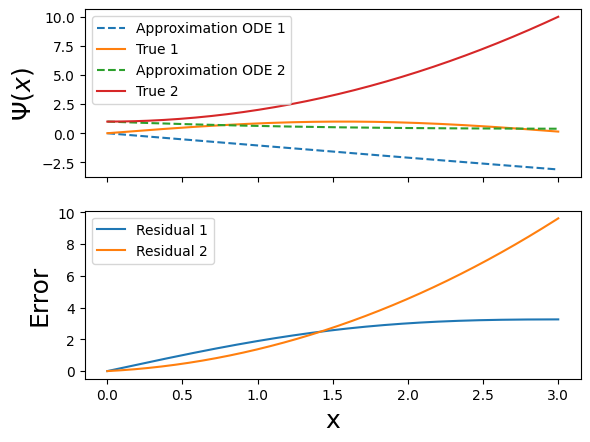

In [ ]:
optimizer1 = torch.optim.Adam(net1.parameters(), lr = 0.0001)
optimizer2 = torch.optim.Adam(net2.parameters(), lr = 0.0001)

# Run the optimizer
def closure():
    optimizer1.zero_grad()
    optimizer2.zero_grad()
    l = loss(x)
    l.backward()
    return l

for i in range(2000):
    optimizer1.step(closure)
    optimizer2.step(closure)
    if i % 200 == 0:
        print(f'Step {i}: ', optimizer1.step(closure), optimizer2.step(closure))


x = torch.linspace(0, 3, 200, requires_grad=True).unsqueeze(1)
y_approx1 = (x * net1(x)).squeeze(0).detach().numpy().transpose()[0]
y_exact1 = (torch.sin(x)).squeeze(0).detach().numpy().transpose()[0]

y_approx2 = (1 + x * net2(x)).squeeze(0).detach().numpy().transpose()[0]
y_exact2 = (1 + x**2).squeeze(0).detach().numpy().transpose()[0]

x = x.squeeze(0).detach().numpy().transpose()[0]

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
# Plot the analytical solution with the approximation
ax1.plot(x, y_approx1, '--' , label='Approximation ODE 1')
ax1.plot(x, y_exact1, label='True 1')
ax1.plot(x, y_approx2, '--' , label='Approximation ODE 2')
ax1.plot(x, y_exact2, label='True 2')
ax1.legend()

# Plot the residual
ax2.plot(x, y_exact1-y_approx1, label='Residual 1')
ax2.plot(x, y_exact2-y_approx2, label='Residual 2')
ax2.legend()

ax2.set_xlabel('x', fontsize=18)
ax1.set_ylabel("$\Psi(x)$", fontsize=18)
ax2.set_ylabel("Error", fontsize=18)

In [ ]:
x = torch.Tensor(np.linspace(0, 3, 200)).reshape(-1,1)
x.shape

torch.Size([200, 1])

In [ ]:
net1 = nn.Sequential(
    nn.Linear(1, 32),
    nn.Sigmoid(),
    nn.Linear(32,1, bias=False)
)

net2 = nn.Sequential(
    nn.Linear(1, 32),
    nn.Sigmoid(),
    nn.Linear(32,1, bias=False)
)

Step 0:  tensor(420.1174, grad_fn=<AddBackward0>) tensor(70.7456, grad_fn=<AddBackward0>)
Step 400:  tensor(0.9910, grad_fn=<AddBackward0>) tensor(0.9897, grad_fn=<AddBackward0>)
Step 800:  tensor(0.0145, grad_fn=<AddBackward0>) tensor(0.0146, grad_fn=<AddBackward0>)
Step 1200:  tensor(0.0160, grad_fn=<AddBackward0>) tensor(0.0159, grad_fn=<AddBackward0>)
Step 1600:  tensor(0.0035, grad_fn=<AddBackward0>) tensor(0.0034, grad_fn=<AddBackward0>)


Text(0, 0.5, 'Error')

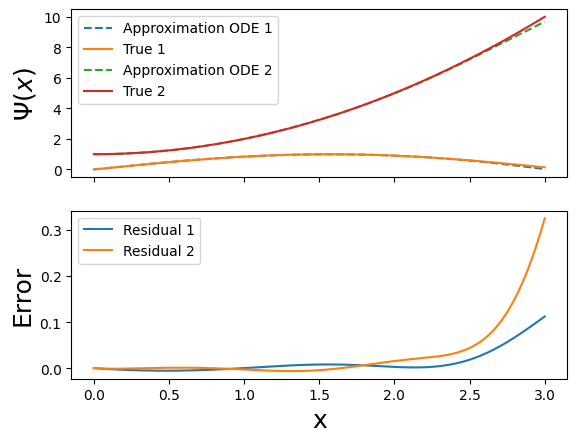

In [ ]:
optimizer1 = torch.optim.Adam(net1.parameters(), lr = 0.1)
optimizer2 = torch.optim.Adam(net2.parameters(), lr = 0.1)

# Run the optimizer
def closure():
    optimizer1.zero_grad()
    optimizer2.zero_grad()
    l = loss(x)
    l.backward()
    return l

for i in range(2000):
    optimizer1.step(closure)
    optimizer2.step(closure)
    if i % 400 == 0:
        print(f'Step {i}: ', optimizer1.step(closure), optimizer2.step(closure))


x = torch.linspace(0, 3, 200, requires_grad=True).unsqueeze(1)
y_approx1 = (x * net1(x)).squeeze(0).detach().numpy().transpose()[0]
y_exact1 = (torch.sin(x)).squeeze(0).detach().numpy().transpose()[0]

y_approx2 = (1 + x * net2(x)).squeeze(0).detach().numpy().transpose()[0]
y_exact2 = (1 + x**2).squeeze(0).detach().numpy().transpose()[0]

x = x.squeeze(0).detach().numpy().transpose()[0]

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
# Plot the analytical solution with the approximation
ax1.plot(x, y_approx1, '--', label='Approximation ODE 1')
ax1.plot(x, y_exact1, label='True 1')
ax1.plot(x, y_approx2, '--', label='Approximation ODE 2')
ax1.plot(x, y_exact2, label='True 2')
ax1.legend()

# Plot the residual
ax2.plot(x, y_exact1-y_approx1, label='Residual 1')
ax2.plot(x, y_exact2-y_approx2, label='Residual 2')
ax2.legend()

ax2.set_xlabel('x', fontsize=18)
ax1.set_ylabel("$\Psi(x)$", fontsize=18)
ax2.set_ylabel("Error", fontsize=18)

# PDEs

## Ex1:
$$
  \frac{\partial u}{\partial t} = \frac{\partial^2 u}{\partial x^2} - e^{-t}((sin\pi x) - \pi ^2 sin(\pi x))
$$
với
$$
  x \in [-1, 1], \\ t \in [0, 1]
$$

IC: 
$$
  y(x, 0) = sin(\pi x)
$$

BC:
$$
  y(1, t) = 0 \\
  y(-1, t) = 0
$$

Analytical solution:
$$
  y(x, t) = e^{-t}sin(\pi x)
$$

In [ ]:
def plot3D(X, T, y):
    fig,ax=plt.subplots(1,1)
    cp = ax.contourf(T, X, y,20,cmap="rainbow")
    fig.colorbar(cp) # Add a colorbar to a plot
    ax.set_title('F(x,t)')
    ax.set_xlabel('t')
    ax.set_ylabel('x')
    plt.show()
    ax = plt.axes(projection='3d')
    ax.plot_surface(T.numpy(), X.numpy(), y.numpy(),cmap="rainbow")
    ax.set_xlabel('t')
    ax.set_ylabel('x')
    ax.set_zlabel('f(x,t)')
    plt.show()

In [ ]:
def plotly_3D(y, x, t):
    fig = go.Figure(data=[go.Surface(z=y, x = x, y = t)])
    fig.show()

In [ ]:
def plot3D_Matrix(x,t,y):
    X,T= x,t
    F_xt = y
    fig,ax=plt.subplots(1,1)
    cp = ax.contourf(T,X, F_xt,20,cmap="rainbow")
    fig.colorbar(cp) # Add a colorbar to a plot
    ax.set_title('F(x,t)')
    ax.set_xlabel('t')
    ax.set_ylabel('x')
    plt.show()
    ax = plt.axes(projection='3d')
    ax.plot_surface(T.numpy(), X.numpy(), F_xt.numpy(),cmap="rainbow")
    ax.set_xlabel('t')
    ax.set_ylabel('x')
    ax.set_zlabel('f(x,t)')
    plt.show()

In [ ]:
def loss_C(x_C, y_C):
    return loss_function(net(x_C), y_C)

In [ ]:
def closure():
    lossC = loss_C(X_C, Y_C)
    loss_PDE = lossPDE(X_train_collocation)
    loss = lossC + loss_PDE
    optimizer.zero_grad()
    loss.backward()
    return loss

In [ ]:
def lossPDE(x_PDE):
    x_PDE.requires_grad=True #Enable differentiation
    f = net(x_PDE)

    f_x_t = autograd.grad(f, x_PDE, torch.ones([x_PDE.shape[0], 1]).to(device), retain_graph=True, create_graph=True)[0]
    f_t = f_x_t[:,[1]]

    f_xx_tt = autograd.grad(f_x_t, x_PDE,torch.ones(x_PDE.shape).to(device), create_graph=True)[0]
    f_xx = f_xx_tt[:,[0]]
    
    f = f_t - f_xx + torch.exp(-x_PDE[:, 1:]) * (torch.sin(np.pi * x_PDE[:, 0:1]) - np.pi ** 2 * torch.sin(np.pi * x_PDE[:, 0:1]))
    # return loss_function(f,f_hat)
    return loss_function(f, f_hat)

In [ ]:
def plot_2D(y, x, t):
    fig = plt.figure(figsize=(11, 3))
    ax = fig.add_subplot(111)

    h = ax.imshow(y.detach().numpy(), interpolation='nearest', cmap='rainbow',
                  extent=[t.min(), t.max(), x.min(), x.max()],
                  origin='lower', aspect='auto')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.10)
    cbar = fig.colorbar(h, cax=cax)
    cbar.ax.tick_params(labelsize=15)

    ax.plot(
        X_C[:,1],
        X_C[:,0],
        'kx', label = 'Data (%d points)' % (Y_C.shape[0]),
        markersize = 8,  # marker size doubled
        clip_on = False,
        alpha=.5
    )

    line = np.linspace(x.min(), x.max(), 2)[:,None]
    ax.plot(t[25]*np.ones((2,1)), line, 'w-', linewidth = 1)
    ax.plot(t[50]*np.ones((2,1)), line, 'w-', linewidth = 1)
    ax.plot(t[75]*np.ones((2,1)), line, 'w-', linewidth = 1)

    ax.set_xlabel('$t$', size=20)
    ax.set_ylabel('$x$', size=20)
    ax.legend(
        loc='upper center',
        bbox_to_anchor=(0.9, -0.05),
        ncol=5,
        frameon=False,
        prop={'size': 15}
    )
    ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled
    ax.tick_params(labelsize=15)

    plt.show()

In [ ]:
def plot_test(y_test, X_test, T_test, X_shape):

    arr_x1=X_test.reshape(shape=X_shape).transpose(1,0).detach()
    arr_T1=T_test.reshape(shape=X_shape).transpose(1,0).detach()
    arr_y1=y_test.reshape(shape=X_shape).transpose(1,0).detach()
    arr_y_test=y_test.reshape(shape=X_shape).transpose(1,0).detach()

    plot3D_Matrix(arr_x1,arr_T1,arr_y1)

In [ ]:
def plot_time(y_real, y_test, x, t):
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111)

    gs1 = gridspec.GridSpec(1, 3)
    gs1.update(top=1-1.0/3.0-0.1, bottom=1.0-2.0/3.0, left=0.1, right=0.9, wspace=0.5)

    ax = plt.subplot(gs1[0, 0])
    ax.plot(x, y_real[25,:], 'b-', linewidth = 2, label = 'Exact')
    ax.plot(x, y_test[25,:], 'r--', linewidth = 2, label = 'Prediction')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$u(t,x)$')
    ax.set_title('$t = 0.25$', fontsize = 15)
    ax.axis('square')
    ax.set_xlim([-1.1,1.1])
    ax.set_ylim([-1.1,1.1])

    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(15)

    ax = plt.subplot(gs1[0, 1])
    ax.plot(x, y_real[50,:], 'b-', linewidth = 2, label = 'Exact')
    ax.plot(x, y_test[50,:], 'r--', linewidth = 2, label = 'Prediction')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$u(t,x)$')
    ax.axis('square')
    ax.set_xlim([-1.1,1.1])
    ax.set_ylim([-1.1,1.1])
    ax.set_title('$t = 0.50$', fontsize = 15)
    ax.legend(
        loc='upper center',
        bbox_to_anchor=(0.5, -0.15),
        ncol=5,
        frameon=False,
        prop={'size': 15}
    )

    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(15)

    ax = plt.subplot(gs1[0, 2])
    ax.plot(x, y_real[75,:], 'b-', linewidth = 2, label = 'Exact')
    ax.plot(x, y_test[75,:], 'r--', linewidth = 2, label = 'Prediction')
    ax.set_xlabel('$x$')
    ax.set_ylabel('$u(t,x)$')
    ax.axis('square')
    ax.set_xlim([-1.1,1.1])
    ax.set_ylim([-1.1,1.1])
    ax.set_title('$t = 0.75$', fontsize = 15)

    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
                 ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(15)

    plt.show()

In [ ]:
x = torch.linspace(-1, 1, 200)
t = torch.linspace(0, 1, 200)

In [ ]:
X, T = torch.meshgrid(x, t)

C:\Users\84909\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ..\aten\src\ATen\native\TensorShape.cpp:3191.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [ ]:
def f_real(x,t):
    return torch.exp(-t)*(torch.sin(np.pi*x)) 

In [ ]:
y_real = f_real(X, T)
plotly_3D(y_real, X, T)

## Processing

In [ ]:
X_test = torch.hstack((X.transpose(1,0).flatten()[:,None], T.transpose(1,0).flatten()[:,None]))
Y_test= y_real.transpose(1,0).flatten()[:,None]

In [ ]:
X_test.shape

torch.Size([40000, 2])

In [ ]:
X_IC = torch.hstack((X[:,0][:,None], T[:,0][:,None]))

In [ ]:
Y_IC = torch.sin(np.pi*X_IC[:,0]).reshape(-1, 1)

In [ ]:
# Lower boundary
X_BC_1 = torch.hstack((X[0,:][:,None], T[0,:][:,None]))
Y_BC_1 = torch.zeros(X_BC_1.shape[0], 1)

# Upper Boundary
X_BC_2 = torch.hstack((X[-1,:][:,None], T[-1,:][:,None]))
Y_BC_2 = torch.zeros(X_BC_2.shape[0], 1)

X_C = torch.vstack([X_IC, X_BC_1, X_BC_2])
Y_C = torch.vstack([Y_IC, Y_BC_1, Y_BC_2])

In [ ]:
lb = X_test[0]
ub = X_test[-1]

Num_collocation = 20000
X_train_collocation = lb + (ub - lb) *lhs(2, Num_collocation) # 2 as the inputs are x and t
X_train_collocation =  torch.vstack((X_train_collocation, X_C)) # Add the training poinst to the collocation points

In [ ]:
X_test.shape

torch.Size([40000, 2])

In [ ]:
X_C = X_C.float() #Training Points (BC)
Y_C = Y_C.float() #Training Points (BC)
X_train_collocation = X_train_collocation.float() #Collocation Points

X_test= X_test.float() # the input dataset (complete)
Y_test= Y_test.float() # the real solution

In [ ]:
class PINNs(nn.Module):

    def __init__(self):
        super().__init__() #call __init__ from parent class

        'activation function'
        self.activation = nn.Tanh()

        'loss function'
        self.loss_function = nn.MSELoss(reduction ='mean')

        'Initialise neural network as a list using nn.Modulelist'
        self.layer1 = nn.Linear(2, 20)
        self.layer2 = nn.Linear(20, 20)
        self.layer3 = nn.Linear(20, 20)
        self.layer4 = nn.Linear(20, 20)
        self.layer5 = nn.Linear(20, 20)
        self.output = nn.Linear(20, 1)

        # Initialize the weights using Xavier initialization
        init.xavier_uniform_(self.layer1.weight)
        init.xavier_uniform_(self.layer2.weight)
        init.xavier_uniform_(self.layer3.weight)
        init.xavier_uniform_(self.layer4.weight)
        init.xavier_uniform_(self.layer5.weight)
        init.xavier_uniform_(self.output.weight)

    def Sine(self, x):
        return torch.sin(x)

    def forward(self, x):

        x = torch.tanh(self.layer1(x))
        x = torch.tanh(self.layer2(x))
        x = torch.tanh(self.layer3(x))
        x = self.output(x)
        return x

    def loss_BC(self, X_BC, Y_BC):

        return self.loss_function(self.forward(X_BC), Y_BC)

    def loss_PDE(self, x_PDE):

        f_hat = torch.zeros(x_PDE.shape[0], 1)

        x_PDE.requires_grad=True #Enable differentiation
        f = self.forward(x_PDE)

        # First derivatives
        f_x_t = autograd.grad(f, x_PDE, torch.ones([x_PDE.shape[0], 1]).to(device),
                              retain_graph=True, create_graph=True)[0]
        f_t = f_x_t[:,[1]]

        # Second derivatives
        f_xx_tt = autograd.grad(f_x_t, x_PDE,torch.ones(x_PDE.shape).to(device), create_graph=True)[0]
        f_xx = f_xx_tt[:,[0]]

        f = f_t - f_xx + torch.exp(-x_PDE[:, 1:]) * (torch.sin(np.pi * x_PDE[:, 0:1])
                                                     - np.pi ** 2 * torch.sin(np.pi * x_PDE[:, 0:1]))

        # return loss_function(f,f_hat)
        return self.loss_function(f, f_hat)

In [ ]:
# Initialize the neural network
model = PINNs()

In [ ]:
'L-BFGS Optimizer'
# optimizer = torch.optim.LBFGS(model.parameters(), lr=0.01, max_iter = 250, max_eval = None, tolerance_grad = 1e-05,
#                              tolerance_change = 1e-09, history_size = 100, line_search_fn = 'strong_wolfe')

optimizer = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)

def closure():
    lossBC = model.loss_BC(X_C, Y_C)
    lossPDE = model.loss_PDE(X_train_collocation)
    loss = lossBC + lossPDE
    optimizer.zero_grad()
    loss.backward()
    return loss

def predict(X_test, Y_test):
    f_predict = model.forward(X_test)
    loss_L2 = (torch.linalg.norm((Y_test - f_predict),2)/torch.linalg.norm(Y_test,2)).item()
    return loss_L2

In [ ]:
import pandas as pd
import plotly.graph_objects as go

steps = 200
z_data_list = []
for i in range(steps):

    start_time = time.time()
    if i ==0:
        print("          Training Loss-------------- Test Loss")
    loss = optimizer.step(closure)
    loss_test = predict(X_test, Y_test)
    if i % 10 == 0:
        elapsed = time.time() - start_time
        print('Training time: %.2f' % (elapsed))
        print('Step:', i, ' ', loss.item(), '   ', loss_test)

        y_pred = model.forward(X_test)
        arr_y_pred = y_pred.reshape(shape=X.shape).transpose(1,0).detach()

        z_data = np.array(arr_y_pred)
        z_data_list.append(z_data)



fig = go.Figure(
    data=[go.Surface(z=z_data_list[0])],
    layout=go.Layout(updatemenus=[dict(type="buttons", buttons=[dict(label="Play", method="animate", args=[None])])]),
    frames=[go.Frame(data=[go.Surface(z=k)], name=str(i)) for i, k in enumerate(z_data_list)]
)

fig.update_traces(contours_z=dict(show=True, usecolormap=True, highlightcolor="tomato", project_z=True), colorscale='portland')

fig.update_layout(title='data HEATPILES', autosize=False, width=650, height=500, margin=dict(l=0, r=0, b=0, t=0))

def frame_args(duration):
    return {
            "frame": {"duration": duration},
            "mode": "immediate",
            "fromcurrent": True,
            "transition": {"duration": duration, "easing": "linear"},
        }

sliders = [
            {
                "pad": {"b": 10, "t": 60},
                "len": 0.9,
                "x": 0.1,
                "y": 0,
                "steps": [
                    {
                        "args": [[f.name], frame_args(0)],
                        "label": str(k),
                        "method": "animate",
                    }
                    for k, f in enumerate(fig.frames)
                ],
            }
        ]

fig.update_layout(sliders=sliders)

import plotly.io as pio

ii = 1
pio.write_html(fig, file="Live3D_"+str(ii)+".html", auto_open=True)
# plotly.offline.plot(fig)

          Training Loss-------------- Test Loss
Training time: 0.33
Step: 0   16.926342010498047     2.129814386367798
Training time: 0.20
Step: 10   14.817090034484863     1.1574416160583496
Training time: 0.18
Step: 20   12.543123245239258     0.9798881411552429
Training time: 0.18
Step: 30   9.344672203063965     1.2602237462997437
Training time: 0.18
Step: 40   5.963949203491211     1.545083999633789
Training time: 0.17
Step: 50   4.155228614807129     1.5632556676864624
Training time: 0.18
Step: 60   3.660076856613159     1.2271023988723755
Training time: 0.17
Step: 70   3.2509725093841553     0.9788883924484253
Training time: 0.17
Step: 80   2.86271333694458     1.0309169292449951
Training time: 0.19
Step: 90   2.5150773525238037     1.064833641052246
Training time: 0.17
Step: 100   2.168449640274048     0.9371337890625
Training time: 0.16
Step: 110   1.8268622159957886     0.7885565161705017
Training time: 0.17
Step: 120   1.5064961910247803     0.6958349347114563
Training time:

## Plot

In [ ]:
y_pred = model.forward(X_test)
arr_y_pred = y_pred.reshape(shape=X.shape).transpose(1,0).detach()

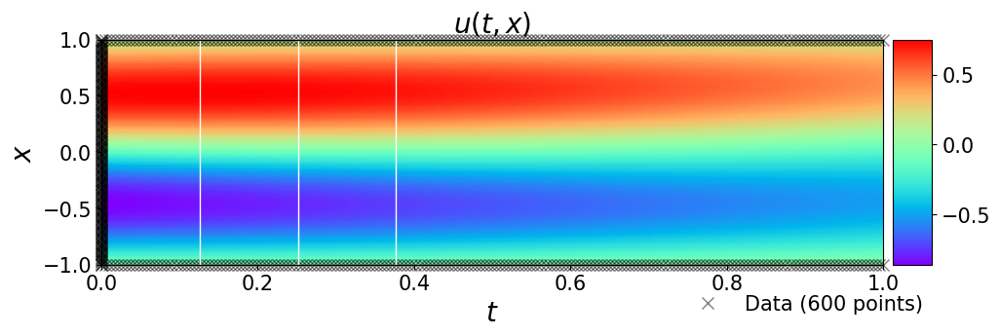

In [ ]:
plot_2D(arr_y_pred, x, t)

In [ ]:
plotly_3D(arr_y_pred, X, T)

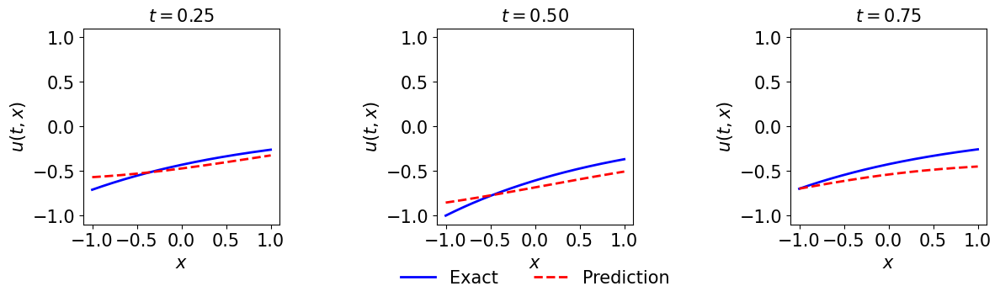

In [ ]:
plot_time(y_real, arr_y_pred, x, t)

## Ex2:
$$
    y_{xx} + y_{tt} = e^{-x}(x-2+t^3+6t), \quad x, t \in [0, 1] \\
$$

IC
$$
    y(x, 0) = xe^{-x} \\
    y(x,1) = e^{-x}(x+1)
$$

BC
$$
    y(0, t) = t^3 \\
    y(1, t) = (1+t^3)e^{-1}
$$

Analytical solution:

$$
    y = e^{-x}(x+t^3)
$$

In [ ]:
x = torch.Tensor(np.linspace(0, 1, 100))
t = torch.Tensor(np.linspace(0, 1, 100))

# Create the mesh
X,T = torch.meshgrid(x, t)

In [ ]:
def f_real(x,t):
    return torch.exp(-x)*(x+t**3) 

y_real=f_real(X, T)
plot3D(X, T, y_real)

In [ ]:
plotly_3D(y_real, X, T)

In [ ]:
X_test = torch.hstack((X.transpose(1,0).flatten()[:,None], T.transpose(1,0).flatten()[:,None]))
Y_test= y_real.transpose(1,0).flatten()[:,None]

In [ ]:
X_0 = X_test[0]
X_last = X_test[-1]

In [ ]:
# IC
X_IC_0 = torch.hstack((X[:,0][:,None], T[:,0][:,None]))
X_IC_1 = torch.hstack((X[:,1][:,None], T[:,-1][:,None]))

Y_IC_0 = (X_IC_0[:,0] * torch.exp(-X_IC_0[:,0])).reshape(-1,1)
Y_IC_1 = ((X_IC_1[:,0] + 1) * torch.exp(-X_IC_1[:,0])).reshape(-1,1)

In [ ]:
# Lower boundary
X_BC_1 = torch.hstack((X[0,:][:,None], T[0,:][:,None]))
Y_BC_1 = (X_BC_1[:,1]**3).reshape(-1,1)

# Upper Boundary
X_BC_2 = torch.hstack((X[-1,:][:,None], T[-1,:][:,None]))
Y_BC_2 = ((1 + X_BC_2[:,1]**3) *np.exp(-1)).reshape(-1,1)

X_C = torch.vstack([X_IC_0, X_BC_1, X_BC_2, X_IC_1])
Y_C = torch.vstack([Y_IC_0, Y_BC_1, Y_BC_2, Y_IC_1])

In [ ]:
# train_collocation = training + collocation

X_train_collocation = collocation(10000, X_0, X_last, X_C)
f_hat = torch.zeros(X_train_collocation.shape[0],1)

In [ ]:
X_C = X_C.float()
Y_C = Y_C.float()
X_train_collocation = X_train_collocation.float()

X_test= X_test.float() # the input dataset (complete)
Y_test= Y_test.float() # the real solution

In [ ]:
net = nn.Sequential(
    nn.Linear(2, 32),
    nn.Tanh(),
    nn.Linear(32, 32),
    nn.Tanh(),
    nn.Linear(32, 1),
).to(device = device)

loss_function = nn.MSELoss(reduction ='mean')

In [ ]:
def lossC(x_BC, y_BC):
    return loss_function(net(x_BC), y_BC)

def lossPDE(x_PDE):
    x_PDE.requires_grad=True #Enable differentiation
    f = net(x_PDE)
    x = x_PDE[:, 0].reshape(-1,1)
    t = x_PDE[:, 1].reshape(-1,1)

    f_x_t = autograd.grad(f, x_PDE,torch.ones([x_PDE.shape[0], 1]).to(device), retain_graph=True, create_graph=True)[0]

    f_xx_tt = autograd.grad(f_x_t, x_PDE,torch.ones(x_PDE.shape).to(device), create_graph=True)[0]
    f_xx = f_xx_tt[:,[0]]
    f_tt = f_xx_tt[:,[1]]
    f = f_tt + f_xx - torch.exp(-x).reshape(-1,1) * (x - 2 + t**3 + 6*t).reshape(-1,1)
    return loss_function(f,f_hat)

In [ ]:
optimizer = torch.optim.LBFGS(net.parameters())

steps = 20
for i in range(steps):
    if i==0:
        print("          Training Loss-----Test Loss")
    optimizer.step(closure)
    if i % 10 == 0:
        with torch.no_grad():
            test_loss= loss_C(X_test,Y_test)
        print('Step:', i, ' ', optimizer.step(closure),'---',test_loss.detach().numpy())

In [ ]:
y1 = net(X_test)
x1=X_test[:,0]
t1=X_test[:,1]

arr_x1=x1.reshape(shape=X.shape).transpose(1,0).detach()
arr_T1=t1.reshape(shape=X.shape).transpose(1,0).detach()
arr_y1=y1.reshape(shape=X.shape).transpose(1,0).detach()
arr_y_test=Y_test.reshape(shape=X.shape).transpose(1,0).detach()

plot3D_Matrix(arr_x1,arr_T1,arr_y1)

In [ ]:
plot_2D(arr_y1, x, t)

In [ ]:
plotly_3D(arr_y1, X, T)

In [ ]:
plot_time(y_real, arr_y1, x, t)

In [ ]:
net = nn.Sequential(
        nn.Linear(2, 32),
        Sine(),
        nn.Linear(32, 32),
        Sine(),
        nn.Linear(32, 1),)

def lossC(x_BC, y_BC):
    return loss_function(net(x_BC), y_BC)

def lossPDE(x_PDE):
    x_PDE.requires_grad=True # Enable differentiation
    f = net(x_PDE)
    x = x_PDE[:, 0].reshape(-1,1)
    t = x_PDE[:, 1].reshape(-1,1)

    f_x_t = autograd.grad(f, x_PDE,torch.ones([x_PDE.shape[0], 1]).to(device), retain_graph=True, create_graph=True)[0]


    f_xx_tt = autograd.grad(f_x_t, x_PDE,torch.ones(x_PDE.shape).to(device), create_graph=True)[0]
    f_xx = f_xx_tt[:,[0]]
    f_tt = f_xx_tt[:,[1]]

    f = f_tt + f_xx - torch.exp(-x).reshape(-1,1) * (x - 2 + t**3 + 6*t).reshape(-1,1)
    return loss_function(f,f_hat)

In [ ]:
optimizer = torch.optim.LBFGS(net.parameters())

steps = 40
for i in range(steps):
    if i==0:
        print("          Training Loss-----Test Loss")
    optimizer.step(closure)
    if i % 10 == 0:
        with torch.no_grad():
            test_loss= loss_C(X_test,Y_test)
        print('Step:', i, ' ', optimizer.step(closure),'---', test_loss.detach().numpy())

In [ ]:
plot_time(y_real, arr_y1, x, t)